In [1]:
import json
import pandas as pd


In [3]:
with open (".\\..\\VIST\\sis\\train.story-in-sequence.json") as f:
    data = json.load(f)

In [4]:
# Build the image dictionary, which is querable by image id.

image_by_id = {x["id"]: x for x in data["images"]}
print(f"Number of images: {len(image_by_id.keys())}")
list(image_by_id.keys())[:5]


Number of images: 167528


['2626977325', '2627795780', '2762593799', '2626979987', '2701863545']

In [5]:
# Builds the story dictionary, which is querable by story id.

df = pd.DataFrame([d[0] for d in data["annotations"]])
stories = df.groupby(["story_id"])
story_by_id = {k: stories.get_group(k).to_dict(orient='records') for k in stories.groups.keys()}
print(f"Number of stories: {len(story_by_id.keys())}")
list(story_by_id.keys())[:5]


Number of stories: 40155


['0', '1', '10', '100', '1000']

In [6]:
from PIL import Image
import requests
from io import BytesIO

def explore_images(story_id):
    story_photos = [{"text": x["text"], "image": image_by_id[x["photo_flickr_id"]]["url_o"]} for x in story_by_id[story_id]]
    
    for photo in story_photos:
        response = requests.get(photo["image"])
        img = Image.open(BytesIO(response.content))
        print(photo["text"])
        display(img)


we drove to the event .


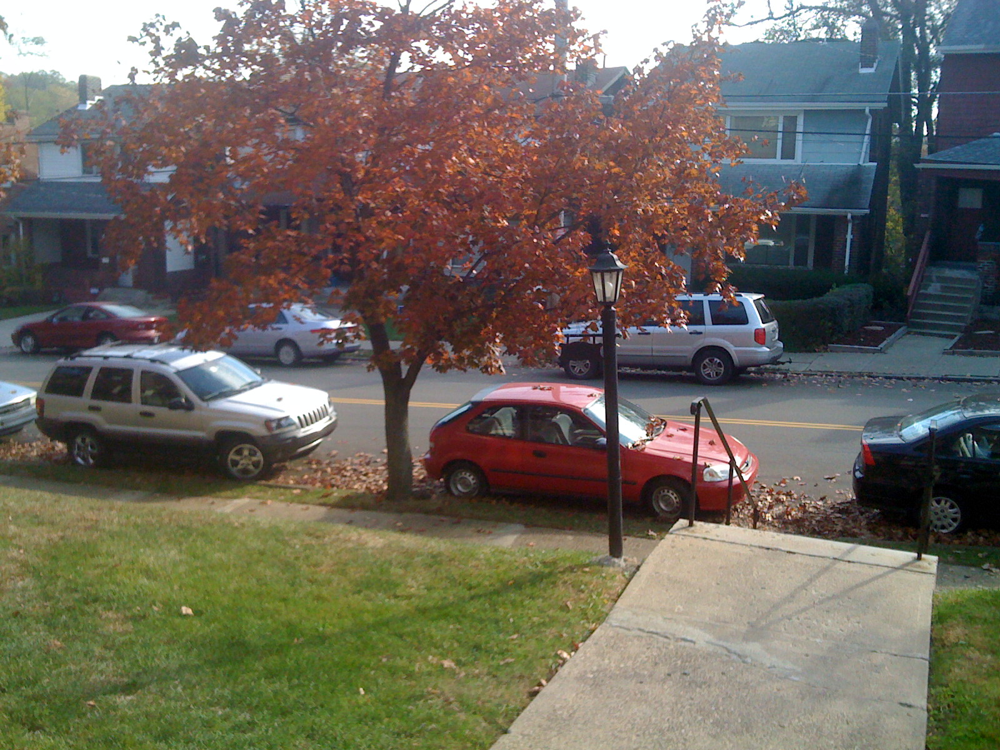

it was in an old brick building .


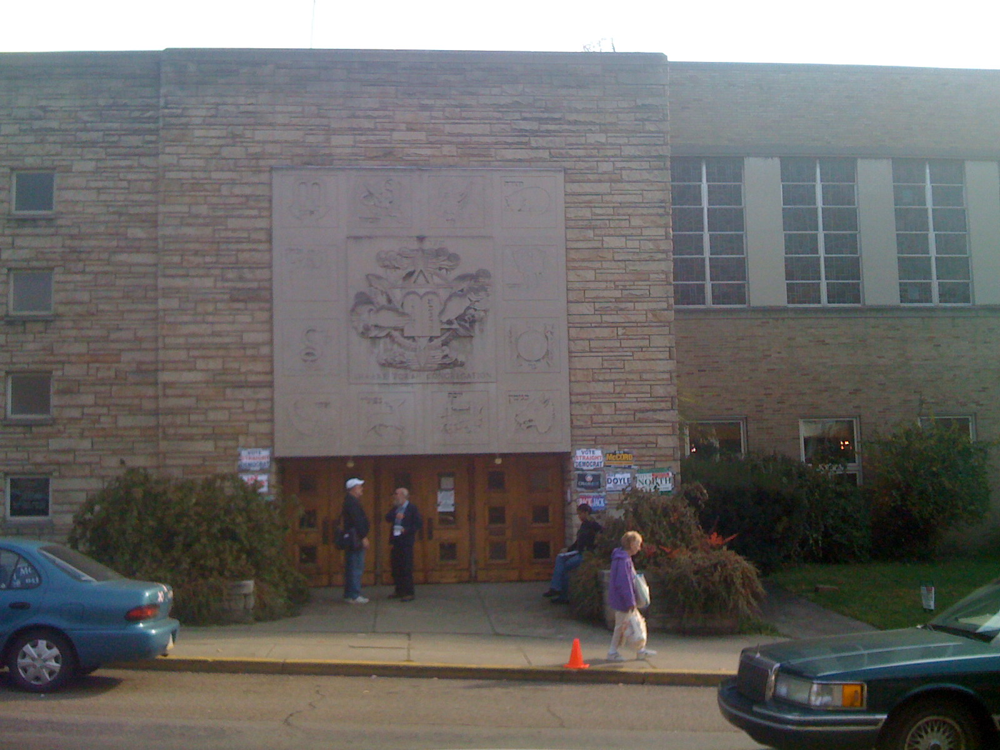

saw some of the other supports .


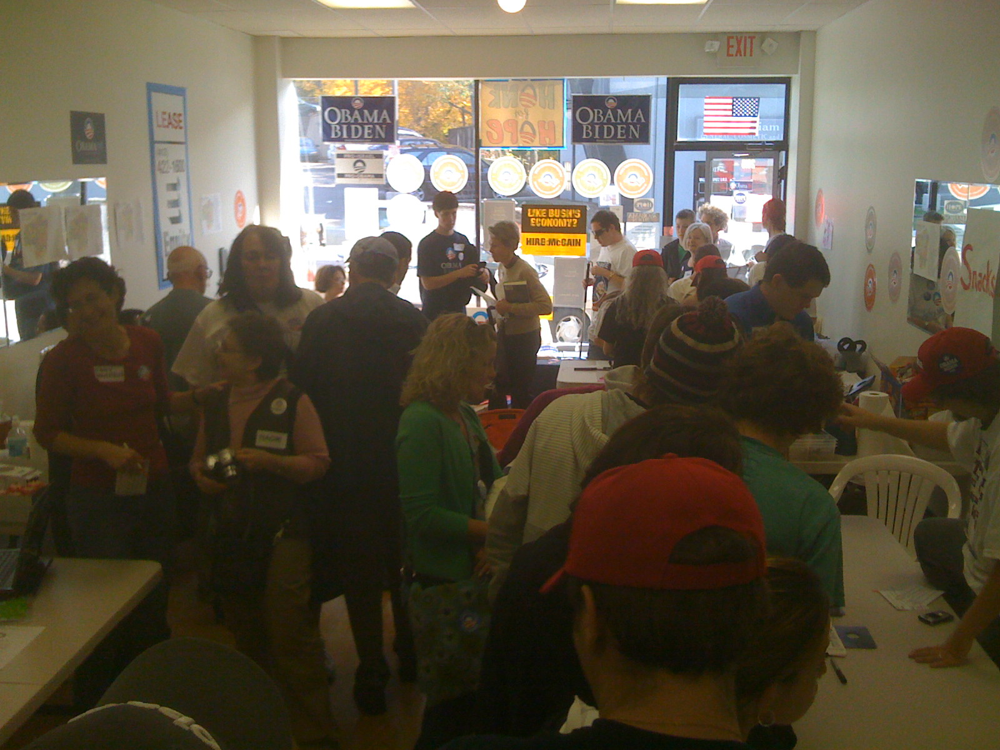

and got to work on the campaign .


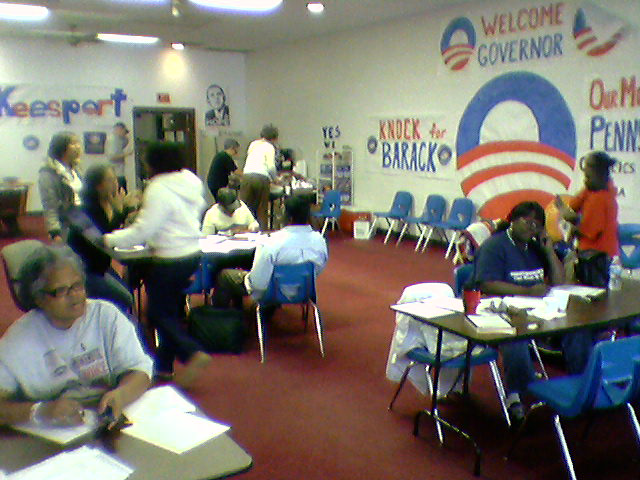

pretty soon the place saw packed .


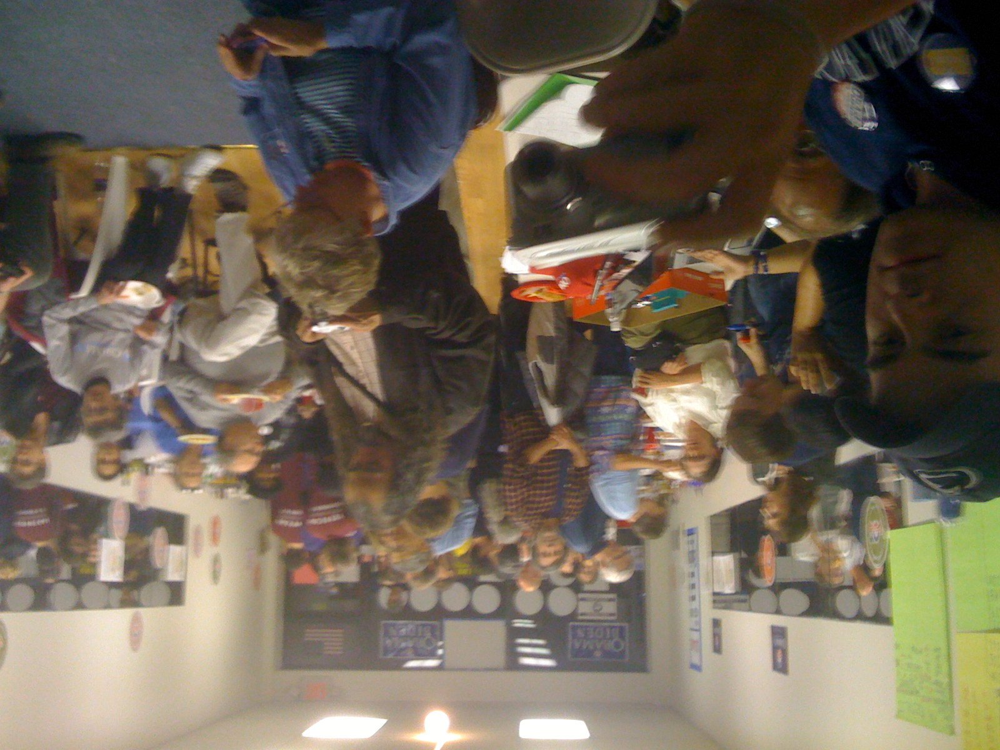

In [8]:
explore_images("1000")